In [1]:
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import numpy as np
import pandas as pd
from skyfield.api import load
from skyfield import almanac, units
from skyfield.elementslib import osculating_elements_of
try:
    from rich import print
except ImportError:
    pass

import plot_utils as pt

kernel = load('de421.bsp')
ts = load.timescale()

def ellipse(ecc, a, t):
    b = np.sqrt(meana**2 * (1 - ecc**2))
    x = a * np.cos(t)
    y = b * np.sin(t)
    return np.array([x, y])

In [2]:
tn = ts.now()

hours = ts.linspace(tn, tn+365.24, int(365 * 24))

In [3]:
print(kernel)

SPICE kernel file 'de421.bsp' has 15 segments
  JD 2414864.50 - JD 2471184.50  (1899-07-28 through 2053-10-08)
      0 -> 1    SOLAR SYSTEM BARYCENTER -> MERCURY BARYCENTER
      0 -> 2    SOLAR SYSTEM BARYCENTER -> VENUS BARYCENTER
      0 -> 3    SOLAR SYSTEM BARYCENTER -> EARTH BARYCENTER
      0 -> 4    SOLAR SYSTEM BARYCENTER -> MARS BARYCENTER
      0 -> 5    SOLAR SYSTEM BARYCENTER -> JUPITER BARYCENTER
      0 -> 6    SOLAR SYSTEM BARYCENTER -> SATURN BARYCENTER
      0 -> 7    SOLAR SYSTEM BARYCENTER -> URANUS BARYCENTER
      0 -> 8    SOLAR SYSTEM BARYCENTER -> NEPTUNE BARYCENTER
      0 -> 9    SOLAR SYSTEM BARYCENTER -> PLUTO BARYCENTER
      0 -> 10   SOLAR SYSTEM BARYCENTER -> SUN
      3 -> 301  EARTH BARYCENTER -> MOON
      3 -> 399  EARTH BARYCENTER -> EARTH
      1 -> 199  MERCURY BARYCENTER -> MERCURY
      2 -> 299  VENUS BARYCENTER -> VENUS
      4 -> 499  MARS BARYCENTER -> MARS

In [4]:
moon_bary = kernel[301] - kernel[3]
ele = osculating_elements_of(moon_bary.at(hours))


In [5]:
ele.eccentricity

array([0.02408225, 0.02372521, 0.02336796, ..., 0.08278462, 0.08307028,
       0.0833527 ])

/Users/kdavis10/.virtualenvs/manim/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


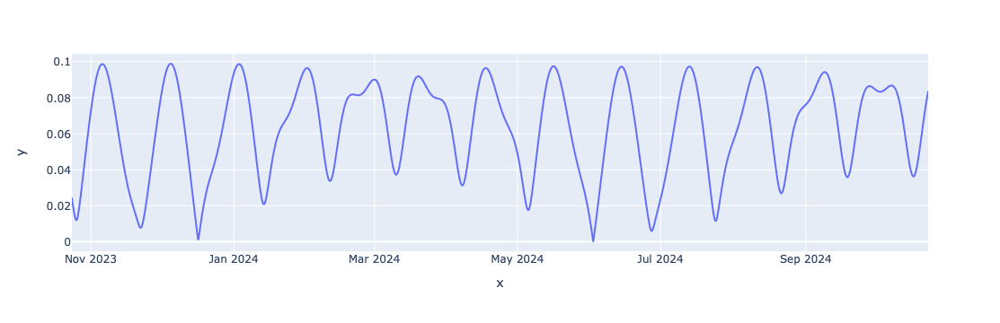

In [6]:
px.line(y=ele.eccentricity, x=hours.utc_datetime())

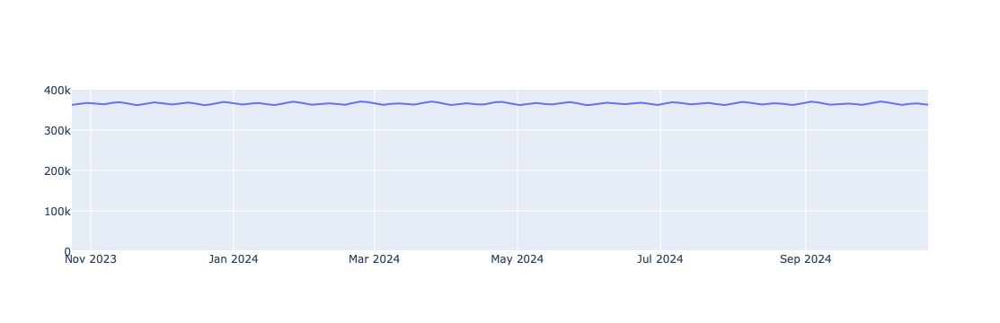

In [7]:
fig = go.Figure()
fig.add_trace(go.Scatter(dict(type="line", x=np.array(hours.utc_datetime()), y=ele.semi_major_axis.km)))
fig.update_yaxes({"range": [0,400000]})
fig.show()

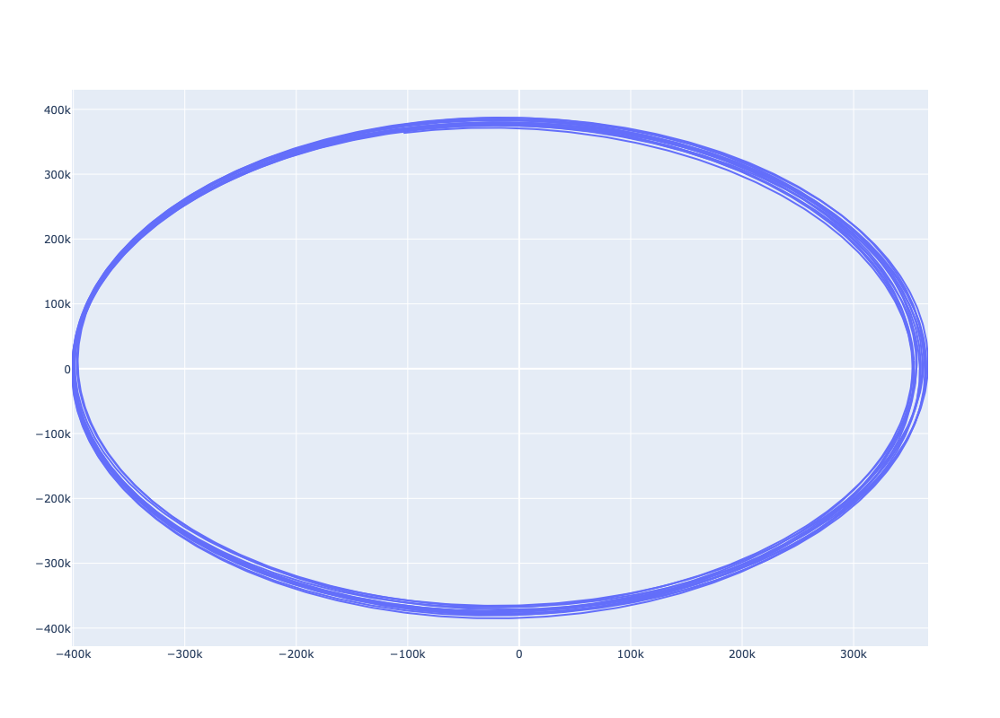

In [8]:
moon_pos = moon_bary.at(hours).ecliptic_xyz().km
efig = go.Figure()
efig.add_trace(go.Scatter(dict(x=moon_pos[0], y=moon_pos[1])))
efig.update_layout(
    width = 800,
    height = 800
)
fig.update_yaxes(
    scaleanchor = "x",
    scaleratio = 1,
  )
efig.show()

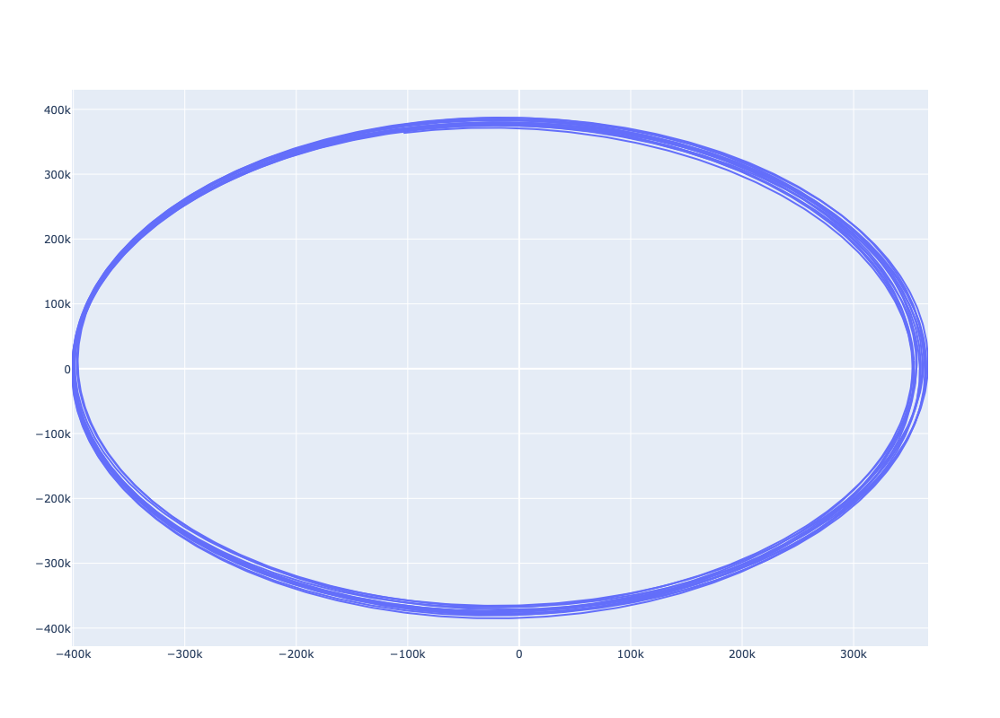

In [9]:
efig.update_traces(selector="line")

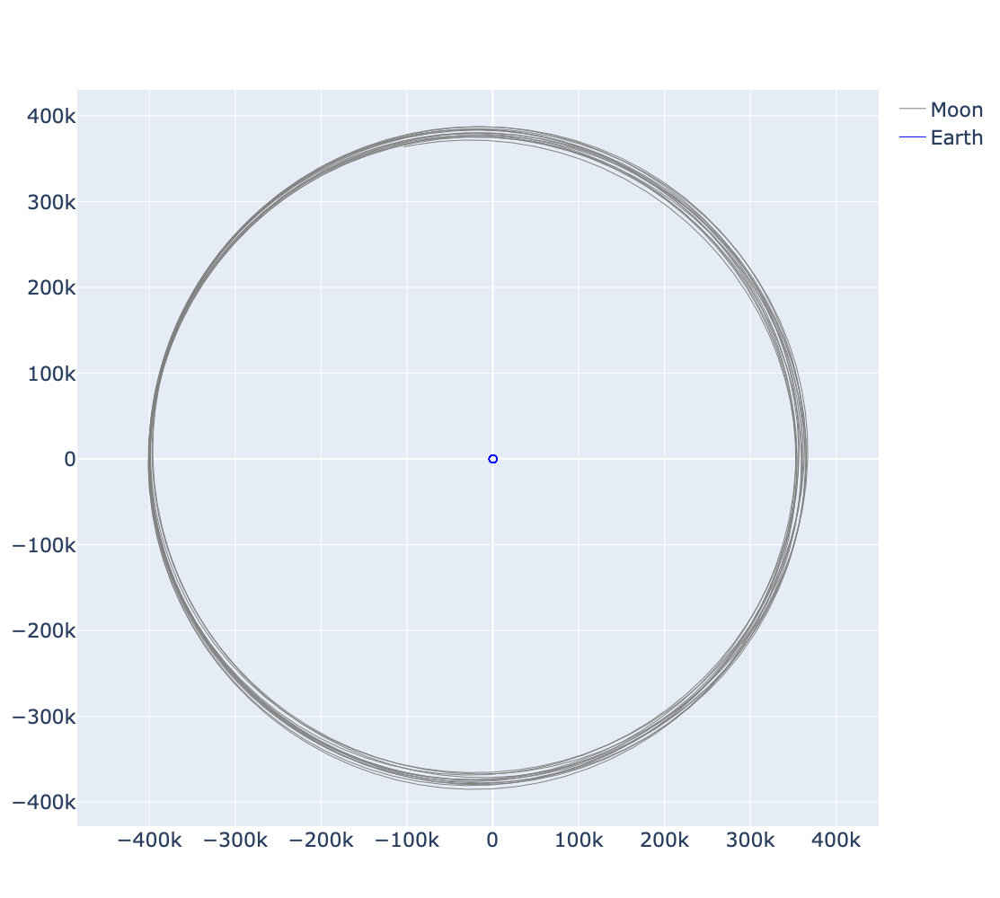

In [26]:

try:
    del efig
except NameError:
    pass

try:
    del fig
except NameError:
    pass

moon_bary = kernel[301] - kernel[3]
moon_pos = moon_bary.at(hours).ecliptic_xyz().km
earth_bary = kernel[399] - kernel[3]
earth_pos = earth_bary.at(hours).ecliptic_xyz().km

try:
    del data
except NameError:
    pass

fig = make_subplots(rows=1, cols=2, column_widths=[0.7, 0.3])

fig = dict(layout = dict(height = 1000,
                         width = 700,
                         font_size=22,
                         yaxis = dict(scaleanchor = "x",
                                      scaleratio = 1
                                     )
                         ),
           data = [dict(name = "Moon",
                        x = moon_pos[0],
                        y = moon_pos[1],
                        line = dict(width = 1
                                    ,
                                    color = "Gray"
                                   )
                       ),
                   dict(name = "Earth",
                        x = earth_pos[0],
                        y = earth_pos[1],
                        line = dict(width = 1,
                                    color = "Blue"
                                   )
                       )
                  ]
          )



efig = go.Figure(fig)
efig.show()

In [24]:
meane = .0549
meana = 0.3844e6
meanb = np.sqrt(meana**2 * (1 - meane**2))

ellipse_norm_mean = ellipse(meane, meana, np.linspace(0, 2*np.pi, 1000))

meane = np.mean(ele.eccentricity)
meana = np.mean(ele.semi_major_axis.km)
meanb = np.mean(ele.semi_minor_axis.km)

ellipse_curr_mean = ellipse(meane, meana, np.linspace(0, 2*np.pi, 1000))

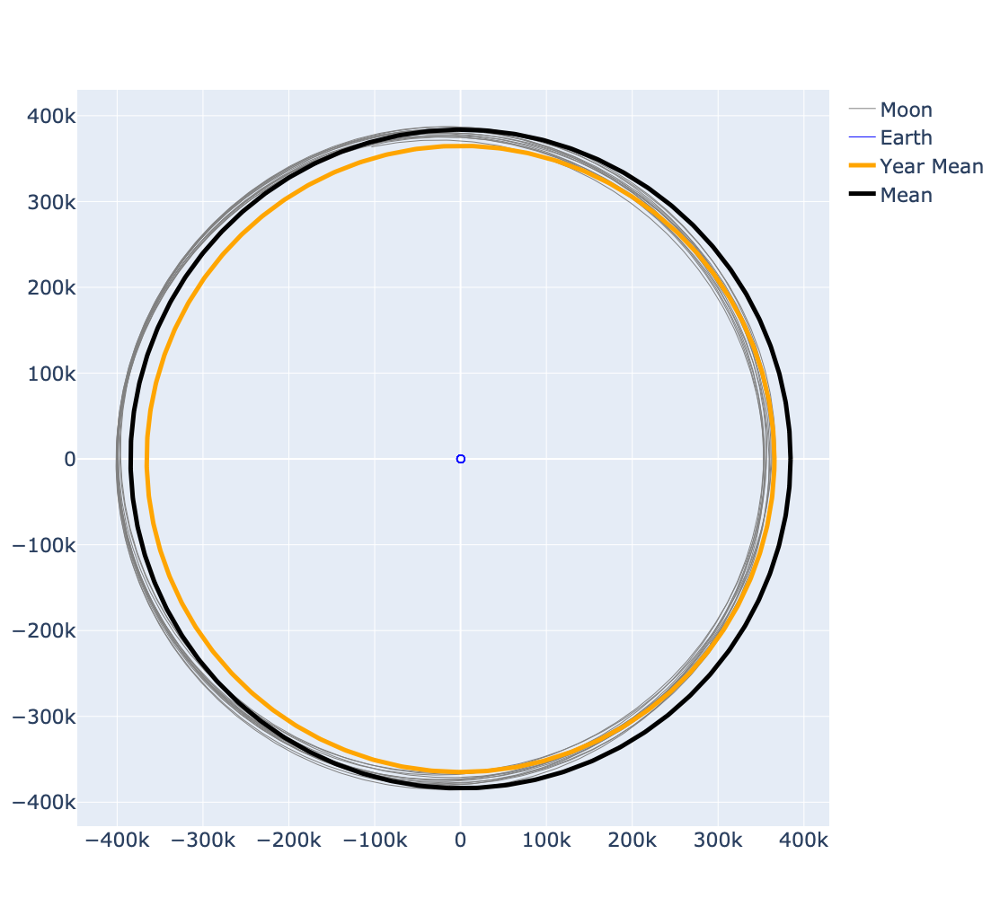

In [27]:
efig.add_scatter(name="Year Mean", x=ellipse_curr_mean[0], y=ellipse_curr_mean[1], line_color="Orange", line_width=5)
efig.add_scatter(name="Mean", x=ellipse_norm_mean[0], y=ellipse_norm_mean[1], line_color="Black", line_width=5)
efig.show()


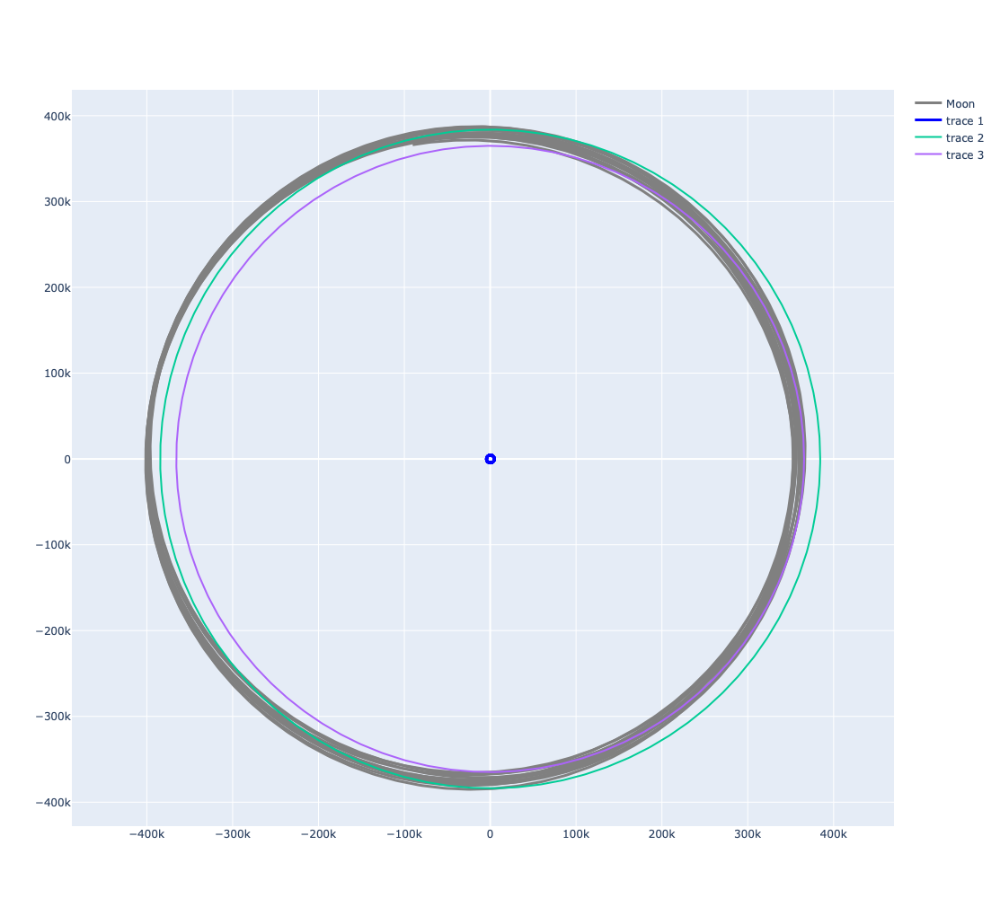

In [169]:
ele.longitude_of_periapsis.degrees

array([ 59.17978972,  59.04797981,  58.89935429, ..., 338.05905665,
       338.13222756, 338.20766324])

/Users/kdavis10/.virtualenvs/manim/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



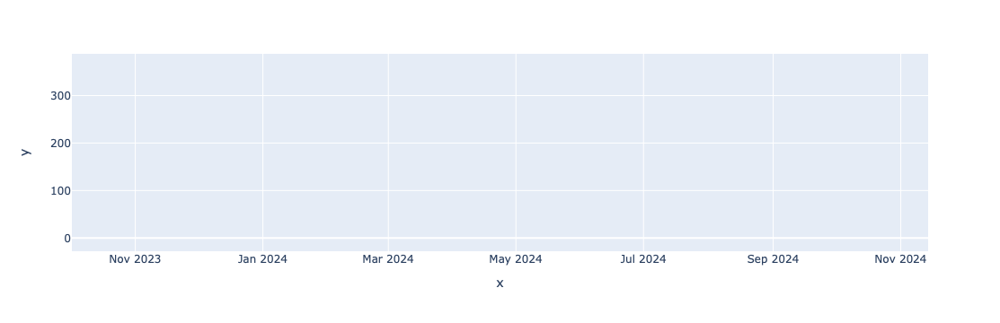

In [171]:
px.scatter(x=hours.utc_datetime(), y=ele.longitude_of_periapsis.degrees)

In [35]:
f = px.line(x=moon_pos[1], y=moon_pos[2])